In [1]:
import pandas as pd

In [2]:
!ls data

headlines.txt


- Read Data

In [7]:
def read_data(filename):
    with open(filename) as f:
        return pd.DataFrame([line.strip() for line in f], columns=['headline'])

In [8]:
df = read_data('data/headlines.txt')

In [13]:
import geonamescache

In [152]:
gc = geonamescache.GeonamesCache()
countries, cities = gc.get_countries(), gc.get_cities()

In [156]:
gc.get_cities_by_name('Miami Beach')

[{'4164143': {'geonameid': 4164143,
   'name': 'Miami Beach',
   'latitude': 25.79065,
   'longitude': -80.13005,
   'countrycode': 'US',
   'population': 92312,
   'timezone': 'America/New_York',
   'admin1code': 'FL'}}]

In [178]:
import unidecode
country_names = [unidecode.unidecode(country_dict['name']) for country_dict in countries.values()]
city_names = [unidecode.unidecode(city_dict['name']) for city_dict in cities.values()]
city_names = sorted(city_names, key=lambda x: len(x), reverse=True)
country_names  = sorted(country_names, key=lambda x: len(x), reverse=True)

In [ ]:
dis_regex = '|'.join(dis_names)
full_dis_regex    = '\\b(' + dis_regex + ')\\b'
full_dis = re.compile(full_dis_regex)

In [38]:
import re

In [179]:
cities_regex = '|'.join(city_names)

In [180]:
countries_regex = '|'.join(country_names)

In [181]:
full_cities_regex    = '\\b(' + cities_regex + ')\\b'
# print(full_cities_regex[-1])
full_countries_regex = '\\b(' + countries_regex + ')\\b'
full_cities_regex = re.compile(full_cities_regex)
full_countries_regex = re.compile(full_countries_regex)

In [173]:
text = 'Miami Beach'
def city_matcher(text, full_cities_regex):
    match = full_cities_regex.search(text)
    return text[match.start():match.end()] if match is not None else None
city_matcher(text,full_cities_regex)

'Miami Beach'

In [153]:
# text = 'Zika Concerns are Spreading in Houston and Brazil'
# def cities_matcher(text, full_cities_regex):
#     matches = full_cities_regex.findall(text)
#     #print(matches[1][0])
#     lst_matches = [match[0] for match in matches] if len(matches)>0 else None
#     return ', '.join(lst_matches) if lst_matches is not None else None
# cities_matcher(text,full_cities_regex)

In [182]:
df['cities']    = [city_matcher(unidecode.unidecode(headline),full_cities_regex) for headline in df['headline']]
df['countries'] = [city_matcher(unidecode.unidecode(headline),full_countries_regex) for headline in df['headline']]

In [177]:
df.fillna(value=pd.np.nan, inplace=True)
df

,headline,cities,countries
0,Zika Outbreak Hits Miami,Miami,NaN
1,Could Zika Reach New York City?,New York City,NaN
2,First Case of Zika in Miami Beach,Miami Beach,NaN
3,"Mystery Virus Spreads in Recife, Brazil",Recife,Brazil
4,Dallas man comes down with case of Zika,Dallas,NaN
5,Trinidad confirms first Zika case,Trinidad,NaN
6,Zika Concerns are Spreading in Houston,Houston,NaN
7,Geneve Scientists Battle to Find Cure,Geneve,NaN
8,The CDC in Atlanta is Growing Worried,Atlanta,NaN
9,Zika Infested Monkeys in Sao Paulo,Sao Paulo,NaN


- let's save progress

In [184]:
df.to_json('result_json.json',orient='records')

In [185]:
ls

1. Extracting City and Country Information from News Headlines.ipynb
README.md
data/
environment.yml
result_json.json
step1_extraction.ipynb


In [189]:
import json
with open('result_json.json', "r") as fin:
    check_data = json.loads(fin.read())

In [190]:
check_data

[{'headline': 'Zika Outbreak Hits Miami',
  'cities': 'Miami',
  'countries': None},
 {'headline': 'Could Zika Reach New York City?',
  'cities': 'New York City',
  'countries': None},
 {'headline': 'First Case of Zika in Miami Beach',
  'cities': 'Miami Beach',
  'countries': None},
 {'headline': 'Mystery Virus Spreads in Recife, Brazil',
  'cities': 'Recife',
  'countries': 'Brazil'},
 {'headline': 'Dallas man comes down with case of Zika',
  'cities': 'Dallas',
  'countries': None},
 {'headline': 'Trinidad confirms first Zika case',
  'cities': 'Trinidad',
  'countries': None},
 {'headline': 'Zika Concerns are Spreading in Houston',
  'cities': 'Houston',
  'countries': None},
 {'headline': 'Geneve Scientists Battle to Find Cure',
  'cities': 'Geneve',
  'countries': None},
 {'headline': 'The CDC in Atlanta is Growing Worried',
  'cities': 'Atlanta',
  'countries': None},
 {'headline': 'Zika Infested Monkeys in Sao Paulo',
  'cities': 'Sao Paulo',
  'countries': None},
 {'headline':

# Step 2: Geolocation

In [191]:
df_new = pd.read_json('result_json.json')

In [192]:
df_new

,headline,cities,countries
0,Zika Outbreak Hits Miami,Miami,None
1,Could Zika Reach New York City?,New York City,None
2,First Case of Zika in Miami Beach,Miami Beach,None
3,"Mystery Virus Spreads in Recife, Brazil",Recife,Brazil
4,Dallas man comes down with case of Zika,Dallas,None
5,Trinidad confirms first Zika case,Trinidad,None
6,Zika Concerns are Spreading in Houston,Houston,None
7,Geneve Scientists Battle to Find Cure,Geneve,None
8,The CDC in Atlanta is Growing Worried,Atlanta,None
9,Zika Infested Monkeys in Sao Paulo,Sao Paulo,None


In [215]:
alternative_names = {unidecode.unidecode(city_dict['name']):city_dict['name'] for city_dict in cities.values()}

In [255]:
def extract_code_lat_long(city_name):
    #print(gc.get_cities_by_name(city_name))
    lst = gc.get_cities_by_name(city_name)
    if not lst and city_name in alternative_names:
        lst = gc.get_cities_by_name(alternative_names[city_name])
    best_cities =  sorted(lst, key=lambda x: list(x.values())[0]['population'],reverse=True)
    best_city= best_cities[0]
    #print(best_cities)
    code_lat_long = [(city['countrycode'],city['latitude'],city['longitude']) for city in best_city.values()]
    code, lat, long = code_lat_long[0]
    return code, lat, long
extract_code_lat_long('Milton')

('CA', 43.51681, -79.88294)

In [249]:
#del df['countries']
df.fillna(value=pd.np.nan, inplace=True)
df.dropna(subset = ["cities"], inplace=True);
df

,headline,cities
0,Zika Outbreak Hits Miami,Miami
1,Could Zika Reach New York City?,New York City
2,First Case of Zika in Miami Beach,Miami Beach
3,"Mystery Virus Spreads in Recife, Brazil",Recife
4,Dallas man comes down with case of Zika,Dallas
5,Trinidad confirms first Zika case,Trinidad
6,Zika Concerns are Spreading in Houston,Houston
7,Geneve Scientists Battle to Find Cure,Geneve
8,The CDC in Atlanta is Growing Worried,Atlanta
9,Zika Infested Monkeys in Sao Paulo,Sao Paulo


In [250]:
all_info = [extract_code_lat_long(city) for city in df['cities']]

In [256]:
df['latitude'] = [info[1] for info in all_info]
df['longitude'] = [info[2] for info in all_info]
df['code'] = [info[0] for info in all_info]
df


,headline,cities,code,latitude,longitude
0,Zika Outbreak Hits Miami,Miami,US,25.77427,-80.19366
1,Could Zika Reach New York City?,New York City,US,40.71427,-74.00597
2,First Case of Zika in Miami Beach,Miami Beach,US,25.79065,-80.13005
3,"Mystery Virus Spreads in Recife, Brazil",Recife,BR,-8.05389,-34.88111
4,Dallas man comes down with case of Zika,Dallas,US,32.78306,-96.80667
5,Trinidad confirms first Zika case,Trinidad,BO,-14.83333,-64.90000
6,Zika Concerns are Spreading in Houston,Houston,US,29.76328,-95.36327
7,Geneve Scientists Battle to Find Cure,Geneve,CH,46.20222,6.14569
8,The CDC in Atlanta is Growing Worried,Atlanta,US,33.74900,-84.38798
9,Zika Infested Monkeys in Sao Paulo,Sao Paulo,BR,-23.54750,-46.63611


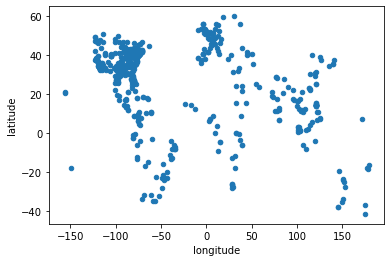

In [257]:
_ = df.plot.scatter(y='latitude', x='longitude')

In [261]:
df = df.rename(columns=dict(code="countrycode", cities="city"))

In [263]:
df.to_csv('data/processed_headlines_locations.csv')

# Let's cluster the data

In [273]:
import numpy as np
import matplotlib.pyplot as plt

In [282]:
data = [[long,lat] for long,lat in zip(df['longitude'],df['latitude'])]

In [299]:
from sklearn.cluster import KMeans, DBSCAN

cluster_model = KMeans(n_clusters=3)
assigned_bulls_eyes = cluster_model.fit_predict(data)



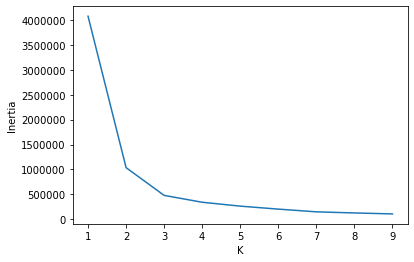

In [288]:
k_values = range(1, 10)
inertia_values = [KMeans(k).fit(data).inertia_
                  for k in k_values]

plt.plot(k_values, inertia_values)
plt.xlabel('K')
plt.ylabel('Inertia')
plt.show()

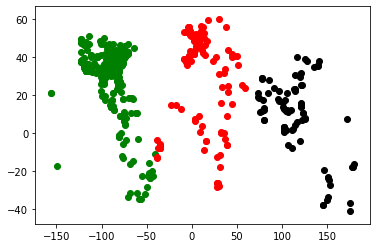

In [300]:
for bs_index in range(3):
    selected_darts = [data[i] for i in range(len(data))
                      if bs_index == assigned_bulls_eyes[i]]
    #print(np.array(selected_darts).T)
    #break
    x_coordinates, y_coordinates = np.array(selected_darts).T
    plt.scatter(x_coordinates, y_coordinates,
                color=['g', 'k','r'][bs_index])
plt.show()

- Let's try DBSCAN

In [315]:
import math

In [323]:
def gc_dist(point1,point2):
    def deg2rad(deg):
        return deg * (math.pi /180)
    R = 3958.8 #radius of earth in miles
    lat1 = point1[1]
    lat2 = point2[1]
    dLat= deg2rad(point2[1] - point1[1])
    dLon= deg2rad(point2[0] - point1[0])
    a = math.sin(dLat/2) * math.sin(dLat/2) + math.cos(deg2rad(lat1)) * math.cos(deg2rad(lat2)) * math.sin(dLon/2) * math.sin(dLon/2)
    c = 2 * math.atan2(math.sqrt(a),math.sqrt(1-a))
    return R * c


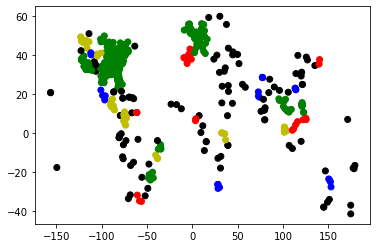

In [332]:
cluster_model = DBSCAN(eps=250,min_samples=3, metric= gc_dist)
rock_clusters = cluster_model.fit_predict(data)
len(set(rock_clusters))
colors = [['g', 'y', 'b','r','k'][cluster//7] for cluster in rock_clusters]
plt.scatter(df['longitude'], df['latitude'],
                color=colors)

In [362]:
df.head(10)

,headline,city,countrycode,latitude,longitude,cluster
0,Zika Outbreak Hits Miami,Miami,US,25.77427,-80.19366,0
1,Could Zika Reach New York City?,New York City,US,40.71427,-74.00597,0
2,First Case of Zika in Miami Beach,Miami Beach,US,25.79065,-80.13005,0
3,"Mystery Virus Spreads in Recife, Brazil",Recife,BR,-8.05389,-34.88111,1
4,Dallas man comes down with case of Zika,Dallas,US,32.78306,-96.80667,0
5,Trinidad confirms first Zika case,Trinidad,BO,-14.83333,-64.90000,-1
6,Zika Concerns are Spreading in Houston,Houston,US,29.76328,-95.36327,0
7,Geneve Scientists Battle to Find Cure,Geneve,CH,46.20222,6.14569,2
8,The CDC in Atlanta is Growing Worried,Atlanta,US,33.74900,-84.38798,0
9,Zika Infested Monkeys in Sao Paulo,Sao Paulo,BR,-23.54750,-46.63611,3


In [360]:
gc_dist([25.77427,-80.19366][::-1], [40.71427,-74.00597][::-1])

1091.6602841495717

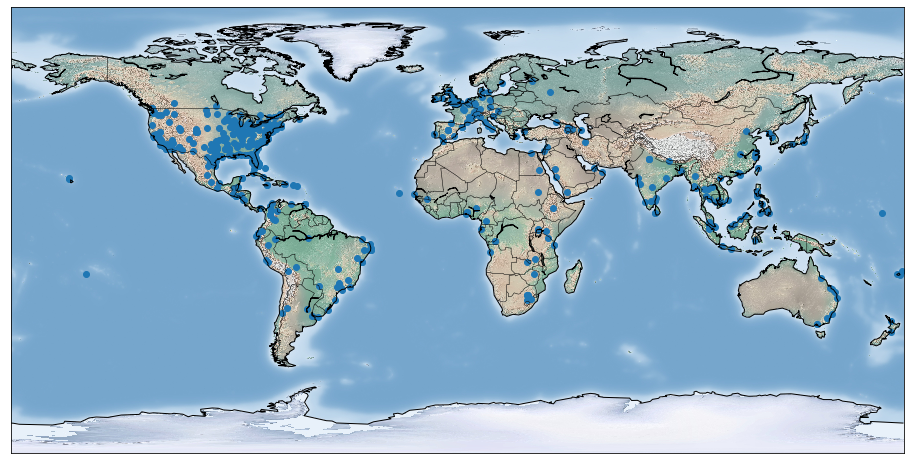

In [364]:
from mpl_toolkits.basemap import Basemap

map_ortho = Basemap()#projection='ortho', lat_0=40, lon_0=-95)
fig = plt.figure(figsize=(16, 10))
map_ortho.scatter(list(df['longitude']), list(df['latitude']), latlon=True)
map_ortho.shadedrelief()
map_ortho.drawcoastlines()
map_ortho.drawcountries()

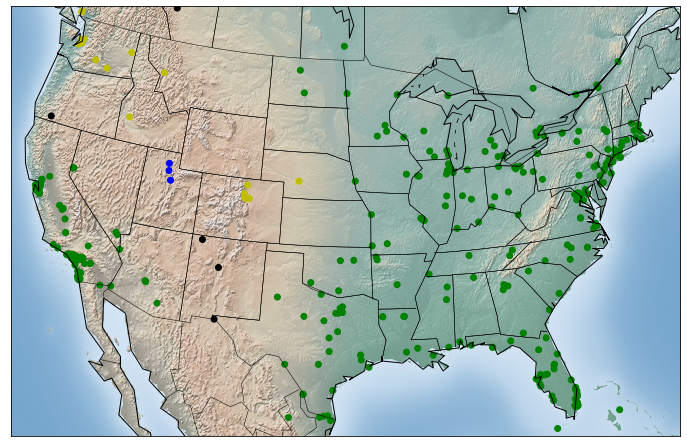

In [353]:
map_ortho = Basemap(projection='lcc', lon_0=-95, llcrnrlon=-119,
                  llcrnrlat=22, urcrnrlon=-64, urcrnrlat=49, lat_1=33,
                  lat_2=45)

fig = plt.figure(figsize=(12, 8))
map_ortho.shadedrelief()
map_ortho.scatter(list(df['longitude']), list(df['latitude']), latlon=True, color=colors)
map_ortho.drawcoastlines()
map_ortho.drawcountries()
map_ortho.drawstates()

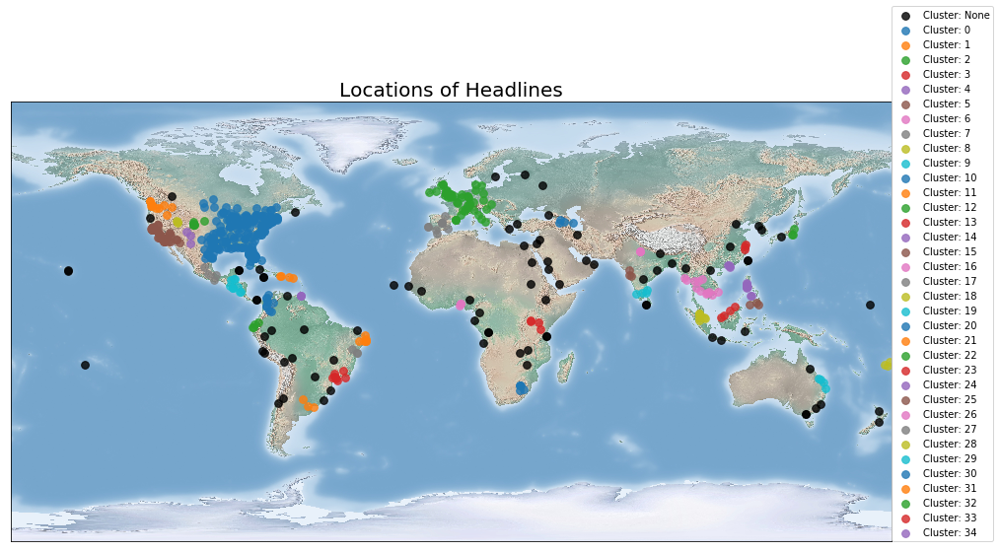

In [371]:
plot_clusters(df)

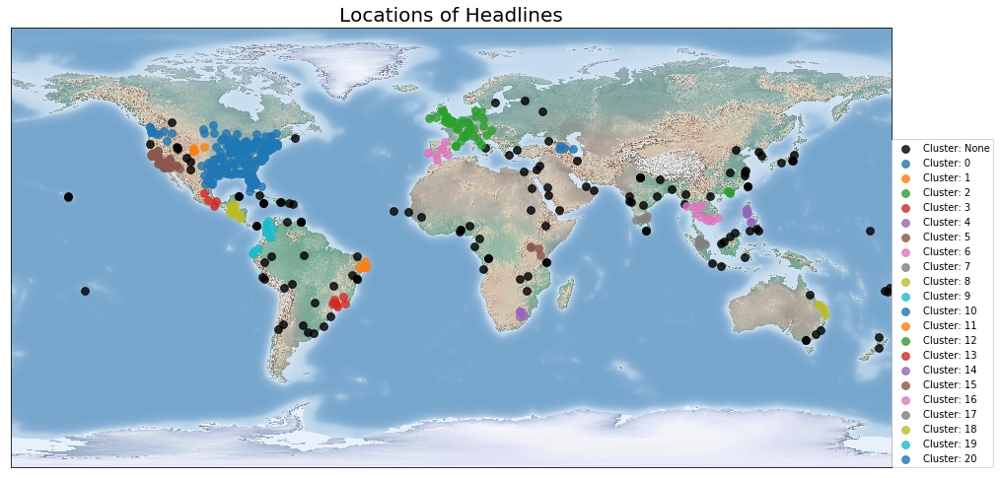

In [373]:
cluster_model = DBSCAN(eps=250,min_samples=4, metric= gc_dist)
rock_clusters = cluster_model.fit_predict(data)
df['cluster']= rock_clusters
plot_clusters(df)

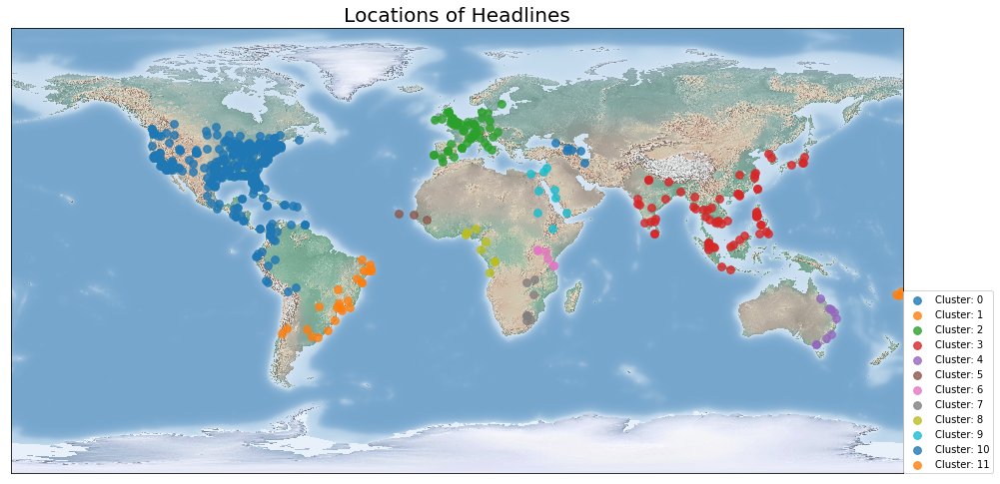

In [376]:
cluster_model = DBSCAN(eps=9,min_samples=3)
rock_clusters = cluster_model.fit_predict(data)
df['cluster']= rock_clusters
plot_clusters(df[df['cluster']!=-1])

In [377]:
df.head(10)

,headline,city,countrycode,latitude,longitude,cluster
0,Zika Outbreak Hits Miami,Miami,US,25.77427,-80.19366,0
1,Could Zika Reach New York City?,New York City,US,40.71427,-74.00597,0
2,First Case of Zika in Miami Beach,Miami Beach,US,25.79065,-80.13005,0
3,"Mystery Virus Spreads in Recife, Brazil",Recife,BR,-8.05389,-34.88111,1
4,Dallas man comes down with case of Zika,Dallas,US,32.78306,-96.80667,0
5,Trinidad confirms first Zika case,Trinidad,BO,-14.83333,-64.90000,0
6,Zika Concerns are Spreading in Houston,Houston,US,29.76328,-95.36327,0
7,Geneve Scientists Battle to Find Cure,Geneve,CH,46.20222,6.14569,2
8,The CDC in Atlanta is Growing Worried,Atlanta,US,33.74900,-84.38798,0
9,Zika Infested Monkeys in Sao Paulo,Sao Paulo,BR,-23.54750,-46.63611,1


# 4. Discovering Pandemics within the United States and Worldwide

In [378]:
df_us  = df[df['countrycode']=='US'] 
df_row = df[df['countrycode']!='US']

In [409]:
def cluster_data(df, model):
    df_copy = df.copy()
    data = [[long,lat] for long,lat in zip(df_copy['longitude'],df_copy['latitude'])]
    df_copy['cluster'] = model.fit_predict(data)#.labels_
    return df_copy

In [599]:
def plot_clusters(data,m=Basemap(),column='cluster'):
    """
    Plot clustered data on a basemap.
    """
    #m = Basemap()
    plt.figure(figsize=(16, 10))
    m.shadedrelief()

    # Iterate through each cluster and plot
    for cluster, grouped in data.groupby(column):
        if cluster == -1:
            # Handle the unassigned headlines
            m.scatter(
                grouped["longitude"],
                grouped["latitude"],
                s=60,
                alpha=0.8,
                marker="o",
                label=f"Cluster: None",
                c="k",
            )
        else:
            m.scatter(
                grouped["longitude"],
                grouped["latitude"],
                s=60,
                alpha=0.8,
                marker="o",
                label=f"Cluster: {cluster}",
            )

    # Add a legend and title (put legend to right of plot)
    ax = plt.gca()
    ax.legend(loc=(1, 0))
    _ = ax.set_title("Locations of Headlines", size=20)

19


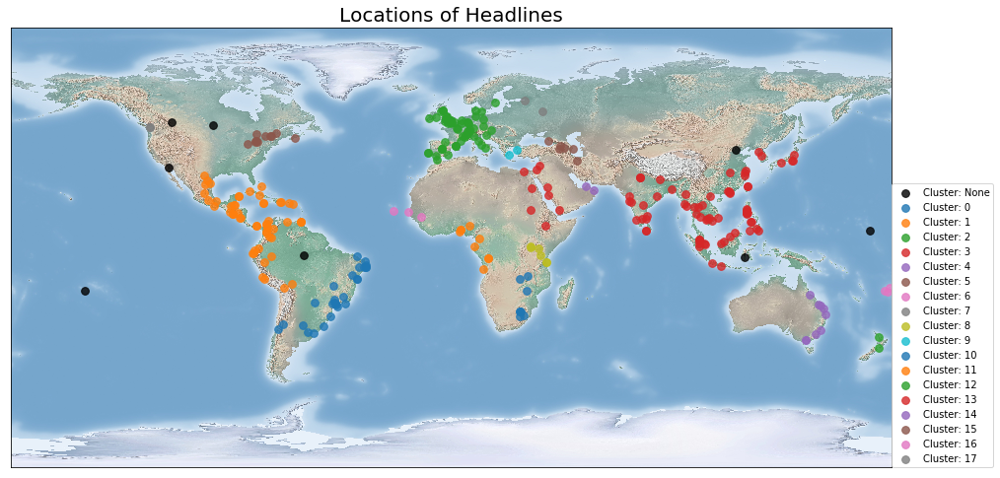

In [424]:
cluster_model = DBSCAN(eps=9,min_samples=2)#, metric= gc_dist)
df_row = cluster_data(df_row, cluster_model)
print(len(set(df_row['cluster'])))
plot_clusters(df_row)

In [486]:
df_row['cluster'].value_counts()

 3     78
 2     62
 1     54
 0     27
 5     11
 13     9
 4      9
 11     9
-1      8
 10     8
 8      6
 15     6
 6      3
 16     3
 17     2
 7      2
 12     2
 14     2
 9      2
Name: cluster, dtype: int64

In [445]:
ave_lat,ave_lon= df_c3.mean().latitude, df_c3.mean().longitude

In [452]:
ave_lon, ave_lat

(107.34070653846153, 16.067994743589743)

In [453]:
points = list(zip(df_c3['longitude'],df_c3['latitude']))
get_ordered_list(points,ave_lon, ave_lat)[:2]

[(109.19432, 12.24507), (105.4635, 11.99339)]

In [456]:
df_c3.sort_values(['longitude']).head()

,headline,city,countrycode,latitude,longitude,cluster
341,Zika symptoms spotted in Surat,Surat,IN,21.19594,72.83023,3
70,Mumbai's Health Minister warns of more Zika cases,Mumbai,IN,19.07283,72.88261,3
71,Pune woman diagnosed with Zika,Pune,IN,18.51957,73.85535,3
423,Outbreak of Zika in Kozhikode,Kozhikode,IN,11.24802,75.78040,3
123,New Delhi Addressing Zika Concerns,New Delhi,IN,28.63576,77.22445,3


In [470]:
def euclidean(point1,point2):
    return math.sqrt((point1[0]-point2[0])**2 + (point1[1]-point2[1])**2)

In [471]:
def get_dist_from_center(center, df):
    df_c3 = df.copy()
    df_c3['distance'] = [euclidean([center[0], center[1]],[lon,lat]) for long, lat in zip(df_c3['longitude'], df_c3['latitude'])]
    return df_c3

In [473]:
get_dist_from_center([ave_lon,ave_lat],df_c3).sort_values(['distance']).head()

,headline,city,countrycode,latitude,longitude,cluster,distance
299,Zika case reported in Phetchabun,Phetchabun,TH,16.41904,101.16056,3,0.351045
290,Zika case reported in Rizal,Rizal,PH,15.71180,121.10610,3,0.356195
592,Zika spreads to Kamphaeng Phet,Kamphaeng Phet,TH,16.48344,99.52153,3,0.415445
34,First Zika case confirmed in Yangon,Yangon,MM,16.80528,96.15611,3,0.737285
532,Zika Troubles come to Jaen,Jaen,PH,15.32750,120.91920,3,0.740495


In [545]:
def top_clusters_df(df):
    df_res = []
    for cluster, grouped in df.groupby("cluster"):
        ave_long, ave_latitude = grouped.mean().longitude, grouped.mean().latitude
        grouped = get_dist_from_center([ave_long, ave_latitude],grouped)
        grouped = grouped.sort_values(['distance'])
        df_res.append(grouped.reset_index())
    
    #print(grouped)
    
    df_temp = pd.concat(df_res) 
    df_temp['size'] = df_temp.groupby('cluster').cluster.transform('size')#.sort_values(['size'])df_row.groupby('cluster').cluster.transform('size')#.sort_values(['size'])

    df_temp= df_temp.sort_values(['size','cluster'],ascending=False)
    return df_temp

In [572]:
df_temp = top_clusters_df(df_row)
df_temp

,index,headline,city,countrycode,latitude,longitude,cluster,size,distance
0,299,Zika case reported in Phetchabun,Phetchabun,TH,16.41904,101.16056,3,78,0.351045
1,290,Zika case reported in Rizal,Rizal,PH,15.71180,121.10610,3,78,0.356195
2,592,Zika spreads to Kamphaeng Phet,Kamphaeng Phet,TH,16.48344,99.52153,3,78,0.415445
3,34,First Zika case confirmed in Yangon,Yangon,MM,16.80528,96.15611,3,78,0.737285
4,532,Zika Troubles come to Jaen,Jaen,PH,15.32750,120.91920,3,78,0.740495
5,112,Zika Outbreak in Hyderabad,Hyderabad,IN,17.38405,78.45636,3,78,1.316055
6,349,Zika arrives in Udon Thani,Udon Thani,TH,17.41567,102.78589,3,78,1.347675
7,443,Bronchitis Keeps Spreading in San Mateo,San Mateo,PH,14.69820,121.12360,3,78,1.369795
8,68,More Quezon City Zika Transmissions,Quezon City,PH,14.64880,121.05090,3,78,1.419195
9,99,Antipolo under threat from Zika Virus,Antipolo,PH,14.62578,121.12251,3,78,1.442215


15


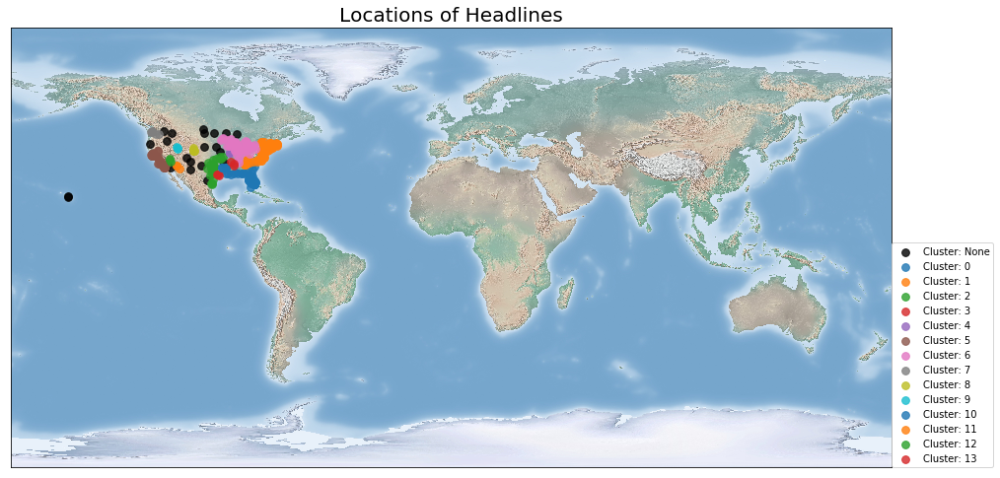

In [577]:
cluster_model = DBSCAN(eps=2,min_samples=3)#, metric= gc_dist)
df_us = cluster_data(df_us, cluster_model)
print(len(set(df_us['cluster'])))
plot_clusters(df_us)#,Basemap(projection='lcc', lon_0=-95, llcrnrlon=-119,
                  #llcrnrlat=22, urcrnrlon=-64, urcrnrlat=49, lat_1=33,
                  #lat_2=45))

In [583]:
df_temp['cluster'].value_counts()

 1     78
 5     51
 0     49
 6     44
 2     25
-1     21
 8      7
 10     6
 7      6
 13     3
 12     3
 11     3
 9      3
 4      3
 3      3
Name: cluster, dtype: int64

In [587]:
pd.set_option('max_colwidth', 400)

In [602]:
df_temp = top_clusters_df(df_us)

#df_temp.style.set_properties(subset=['headline'], **{'width': '300px'})
df_temp[df_temp['cluster']==2]

,index,headline,city,countrycode,latitude,longitude,cluster,distance,size
0,294,Zika case reported in Abilene,Abilene,US,32.44874,-99.73314,2,204.372316,25
1,641,More Zika patients reported in Fort Worth,Fort Worth,US,32.72541,-97.32085,2,204.372442,25
2,280,Zika symptoms spotted in Arlington,Arlington,US,32.73569,-97.10807,2,204.372454,25
3,207,Outbreak of Zika in Stephenville,Stephenville,US,32.22070,-98.20226,2,204.372494,25
4,4,Dallas man comes down with case of Zika,Dallas,US,32.78306,-96.80667,2,204.372516,25
5,386,More Zika patients reported in Carrollton,Carrollton,US,32.95373,-96.89028,2,204.372828,25
6,400,Zika spreads to Lewisville,Lewisville,US,33.04623,-96.99417,2,204.373057,25
7,241,Frisco Woman Tests Positive For Zika Virus,Frisco,US,33.15067,-96.82361,2,204.373366,25
8,363,More Zika patients reported in Waco,Waco,US,31.54933,-97.14667,2,204.374494,25
9,402,Fort Hood Reports its First Zika Patient,Fort Hood,US,31.13489,-97.77561,2,204.376829,25


In [631]:
dis_names = [
    "Mumps","Zika", "Norovirus","HIV","Pneumonia","Rhinovirus","Hepatitis D","Hepatitis C", "Hepatitis B",
    "Hepatitis A", "Bronchitis", "Varicella", "Rabies","Tuberculosis","Swine Flu", "Chickenpox", "Influenza",
    "Gonorrhea","West Nile Virus", "Herpes","Chikungunya", "Respiratory Syncytial Virus", "Measles","Hepatitis E", "Malaria","Rotavirus",
    "Mad Cow Disease", "MCD", "Spanish Flu"
]
dis_regex = '|'.join(dis_names)
full_dis_regex    = '\\b(' + dis_regex + ')\\b'
full_dis_regex = re.compile(full_dis_regex)

In [619]:
df_temp['disease']    = [city_matcher(headline,full_dis_regex) for headline in df_temp['headline']]
df_temp.head()

,index,headline,city,countrycode,latitude,longitude,cluster,distance,size,disease
0,478,Vineland authorities confirmed the spread of Chlamydia,Vineland,US,39.48623,-75.02573,1,183.117969,78,None
1,432,Schools in Bridgeton Closed Due to Mumps Outbreak,Bridgeton,US,39.42734,-75.23408,1,183.118037,78,Mumps
2,26,Philadelphia experts track pandemic,Philadelphia,US,39.95233,-75.16379,1,183.118103,78,None
3,496,Toms River Encounters Severe Symptoms of Respiratory Syncytial Virus,Toms River,US,39.95373,-74.19792,1,183.118106,78,Respiratory Syncytial Virus
4,23,Baltimore plans for Zika virus,Baltimore,US,39.29038,-76.61219,1,183.118267,78,Zika


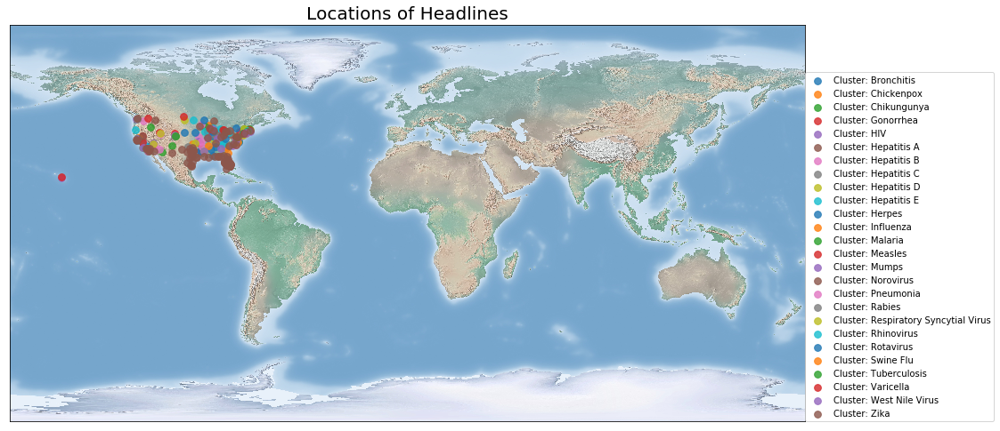

In [621]:
plot_clusters(df_temp, m= Basemap(),
              column='disease')

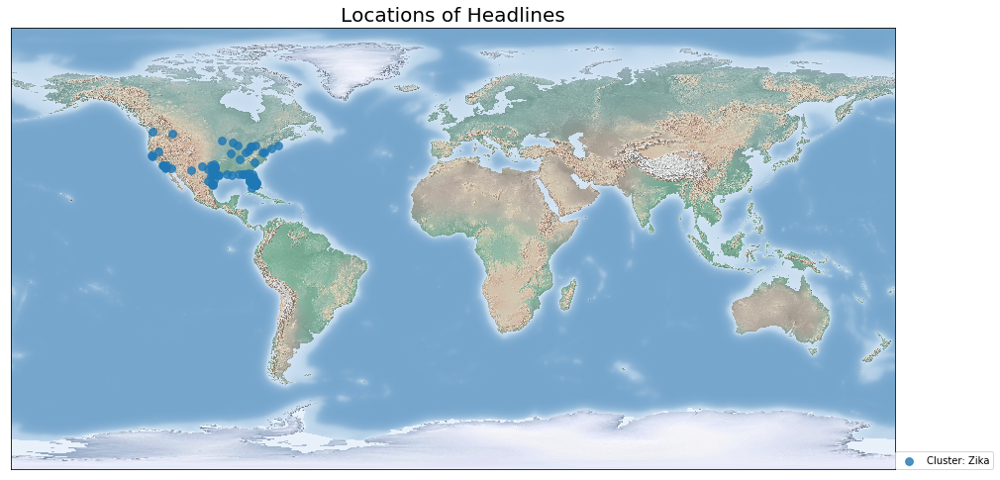

In [615]:
plot_clusters(df_temp[df_temp['disease']=='Zika'], m= Basemap(),
              column='disease')

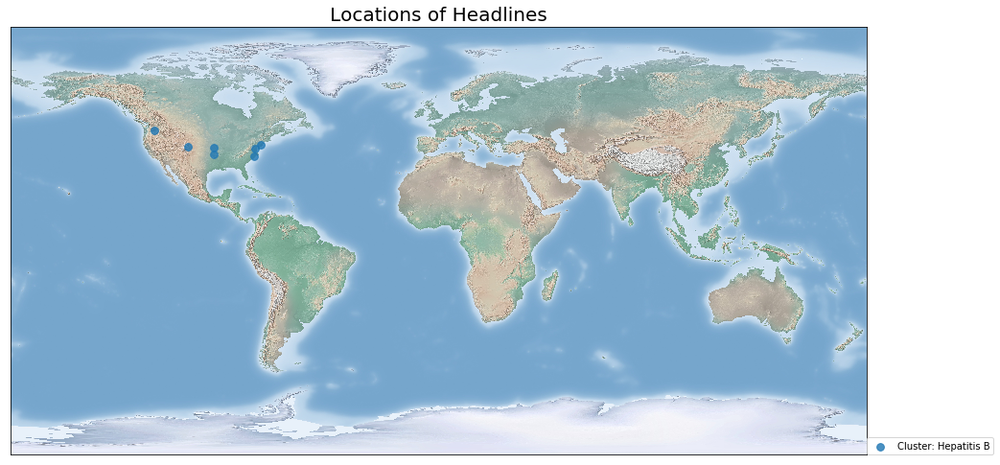

In [620]:
plot_clusters(df_temp[df_temp['disease']=='Hepatitis B'], m= Basemap(),
              column='disease')

- Zika makes it way into which clusters??

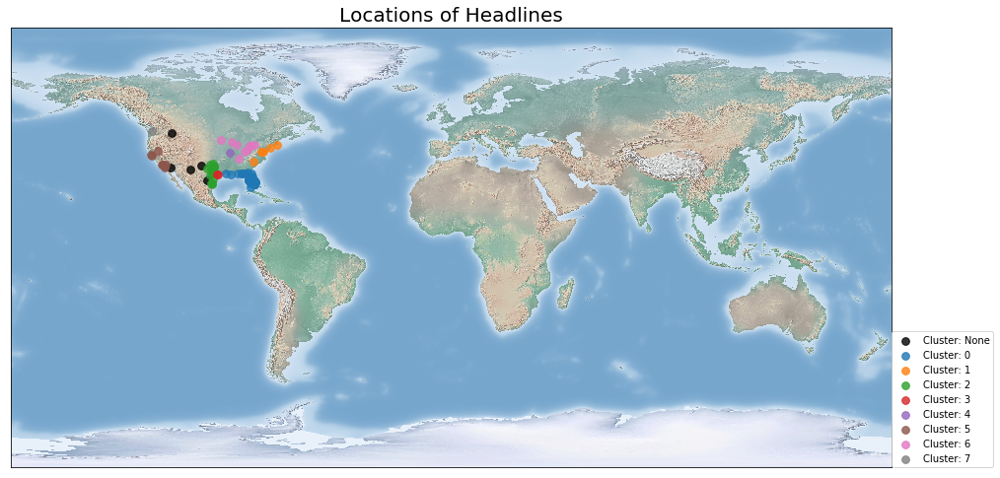

In [622]:
plot_clusters(df_temp[df_temp['disease']=='Zika'], m= Basemap(),
              column='cluster')

### what about the rest of the world?

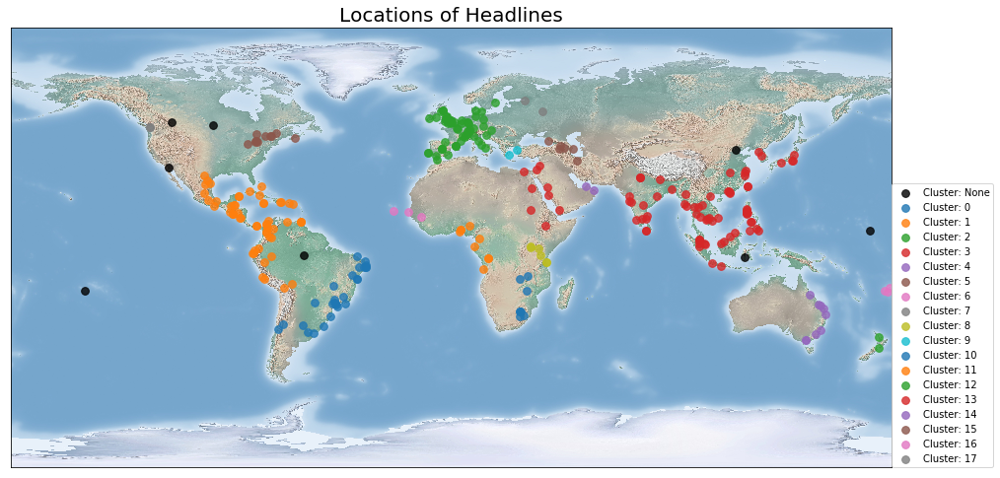

In [626]:
plot_clusters(df_row)

#### let's examine clusters 3,2, and 1, 0

In [628]:
df_temp_row = top_clusters_df(df_row)

In [639]:
df_temp_row[df_temp_row['cluster']==2] # it's mostly mad cow and spanish flu
df_temp_row[df_temp_row['cluster']==3] #it's zika
df_temp_row[df_temp_row['cluster']==1] # zika
df_temp_row[df_temp_row['cluster']==0] # zika

,index,headline,city,countrycode,latitude,longitude,cluster,size,distance,disease
0,94,New Zika Case Confirmed in Belo Horizonte,Belo Horizonte,BR,-19.92083,-43.93778,0,27,153.976298,Zika
1,459,More Zika patients reported in Ribeirao Preto,Ribeirao Preto,BR,-21.17750,-47.81028,0,27,153.983729,Zika
2,392,Pedro Juan Caballero Encounters Severe Symptoms of Pneumonia,Pedro Juan Caballero,PY,-22.54722,-55.73333,0,27,154.003509,Pneumonia
3,44,"Zika outbreak in Piracicaba, Brazil",Piracicaba,BR,-22.72528,-47.64917,0,27,154.006975,Zika
4,168,Zika Troubles come to Niteroi,Niteroi,BR,-22.88333,-43.10361,0,27,154.010224,Zika
5,569,More Zika patients reported in Botucatu,Botucatu,BR,-22.88583,-48.44500,0,27,154.010276,Zika
6,78,"Student sick in Campinas, Brazil",Campinas,BR,-22.90556,-47.06083,0,27,154.010694,None
7,64,Second Zika Paitient in Brasilia,Brasilia,BR,-15.77972,-47.92972,0,27,154.024387,Zika
8,9,Zika Infested Monkeys in Sao Paulo,Sao Paulo,BR,-23.54750,-46.63611,0,27,154.025648,Zika
9,180,Zika arrives in Santos,Santos,BR,-23.96083,-46.33361,0,27,154.036692,Zika


#### let's confirm results above

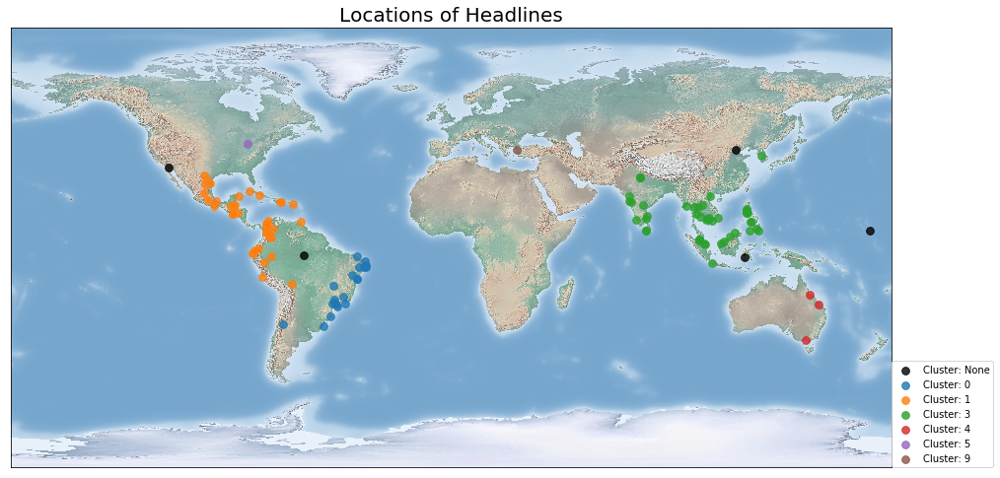

In [640]:
#df_temp_row['disease']    = [city_matcher(headline,full_dis_regex) for headline in df_temp_row['headline']]
plot_clusters(df_temp_row[df_temp_row['disease']=='Zika'], m= Basemap(),
              column='cluster')

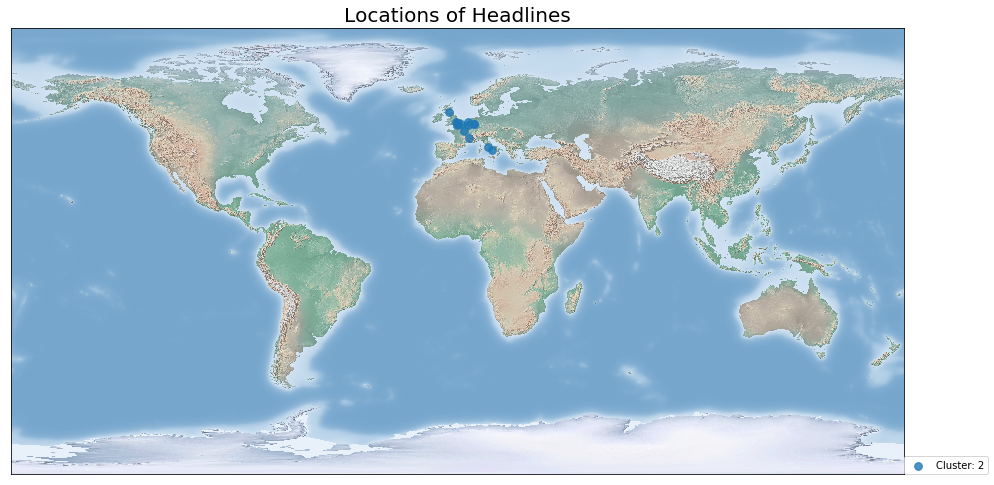

In [641]:
plot_clusters(df_temp_row[df_temp_row['disease']=='Mad Cow Disease'], m= Basemap(),
              column='cluster')

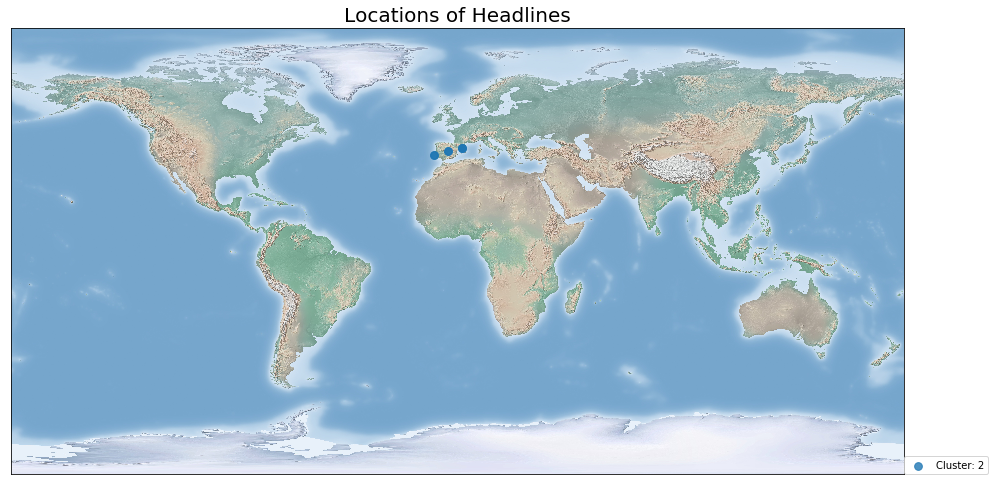

In [642]:
plot_clusters(df_temp_row[df_temp_row['disease']=='Spanish Flu'], m= Basemap(),
              column='cluster')